<a href="https://www.kaggle.com/code/syerramilli/ps3e24-xgboost-for-predicting-smoking-status?scriptVersionId=148164569" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

## Introduction

The objective of this classification task is to predict the smoking status (smoking or not) of an individual using bio-signal data. Within this notebook, we perform some exploratory data analysis, and then train and tune a xgboost classification model

The hyperparameter tuning will be performed through Bayesian optimization via the `BoTorchSampler` API in `optuna`. This API requires the `botorch` library to be installed.


In [1]:
!pip install botorch

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 567.8/567.8 kB 8.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 732.8/732.8 kB 23.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 266.1/266.1 kB 22.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 174.5/174.5 kB 14.0 MB/s eta 0:00:00


In [2]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

from xgboost import XGBClassifier
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import roc_auc_score

import optuna
from optuna.integration.botorch import BoTorchSampler, qei_candidates_func

from pathlib import Path
from typing import Optional, Dict, Tuple

plt.style.use('ggplot')
plt.rcParams.update(**{'figure.dpi':150})

In [3]:
path = Path('/kaggle/input/playground-series-s3e24')

train = pd.read_csv(path / 'train.csv', index_col = ['id'])
test = pd.read_csv(path / 'test.csv', index_col = ['id'])

## Inspecting the data

In [4]:
train.head()

,age,height(cm),weight(kg),waist(cm),eyesight(left),eyesight(right),hearing(left),hearing(right),systolic,relaxation,...,HDL,LDL,hemoglobin,Urine protein,serum creatinine,AST,ALT,Gtp,dental caries,smoking
id,,,,,,,,,,,,,,,,,,,,,
0,55,165,60,81.0,0.5,0.6,1,1,135,87,...,40,75,16.5,1,1.0,22,25,27,0,1
1,70,165,65,89.0,0.6,0.7,2,2,146,83,...,57,126,16.2,1,1.1,27,23,37,1,0
2,20,170,75,81.0,0.4,0.5,1,1,118,75,...,45,93,17.4,1,0.8,27,31,53,0,1
3,35,180,95,105.0,1.5,1.2,1,1,131,88,...,38,102,15.9,1,1.0,20,27,30,1,0
4,30,165,60,80.5,1.5,1.0,1,1,121,76,...,44,93,15.4,1,0.8,19,13,17,0,1


In [5]:
print(f'Number of observations in training data: {train.shape[0]}' )
print(f'Number of columns in training data: {train.shape[1]}')

Number of observations in training data: 159256
Number of columns in training data: 23


All the columns are numerical, and there are no missing values.

In [6]:
train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 159256 entries, 0 to 159255
Data columns (total 23 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   age                  159256 non-null  int64  
 1   height(cm)           159256 non-null  int64  
 2   weight(kg)           159256 non-null  int64  
 3   waist(cm)            159256 non-null  float64
 4   eyesight(left)       159256 non-null  float64
 5   eyesight(right)      159256 non-null  float64
 6   hearing(left)        159256 non-null  int64  
 7   hearing(right)       159256 non-null  int64  
 8   systolic             159256 non-null  int64  
 9   relaxation           159256 non-null  int64  
 10  fasting blood sugar  159256 non-null  int64  
 11  Cholesterol          159256 non-null  int64  
 12  triglyceride         159256 non-null  int64  
 13  HDL                  159256 non-null  int64  
 14  LDL                  159256 non-null  int64  
 15  hemoglobin           1

## Target


The goal of this binary classification task is to predict `smoking` - whether the individual is smoking (label 1) or not (label 0). There is not much class imbalance in the training data.  

In [7]:
# target
train['smoking'].value_counts() / train.shape[0] * 100

smoking
0    56.2635
1    43.7365
Name: count, dtype: float64

## EDA on features

We first check if there is any feature for which its mode has more than 90% of the observations. It is unlikely that any model can reliably use such features. So, we will drop them

In [8]:
from numbers import Number
def get_mode_fraction(x:pd.Series) -> float:
    cts = x.value_counts(sort=True, ascending=False)
    return cts.iloc[0]/x.shape[0]

def filter_greater_than(series:pd.Series,threshold:Number) -> pd.Series:
    '''
    Returns series elements greater than threshold. This funtion can be
    used with the .pipe methods
    '''
    return series[series>threshold]

high_mode_per = (
    train.drop('smoking', axis=1)
    .apply(get_mode_fraction)
    .pipe(filter_greater_than, threshold = 0.9)
)
high_mode_per

hearing(left)     0.976026
hearing(right)    0.976579
Urine protein     0.947292
dtype: float64

In [9]:
# drop these columns
train = train.drop(high_mode_per.index.tolist(), axis=1)

### Checks on features

We check on the cholesterol related features
1. HDL: high-density lipoprotein level (good)
2. LDL: low-density lipoprotein level (bad)
3. triglyceride: type of fat (good/bad)
4. Cholesterol: total amount of cholestorol


The total amount of cholestorol is given by Cholesterol = HDL + LDL + 0.2 * triglyceride (Source: https://my.clevelandclinic.org/health/articles/11920-cholesterol-numbers-what-do-they-mean). There are some entries where this relation is violated by a lot. 

In [10]:
error = (train['HDL'] + train['LDL'] + 0.2*train['triglyceride'] - train['Cholesterol'])
error.describe()

count    159256.000000
mean          0.187410
std          11.403006
min        -149.200000
25%          -0.600000
50%          -0.200000
75%           0.400000
max        1692.800000
dtype: float64

There a are a few LDL entries which are larger than the corresponding total Cholesterol entries.

In [11]:
for column in ['HDL', 'LDL', 'triglyceride']:
    factor = 0.2 if column == 'triglyceride' else 1
    print((
        f'Number of cases where {("0.2 * " if column =="triglyceride" else "") + column}'
        ' > Cholesterol: ' 
        f'{(factor * train[column] > train["Cholesterol"]).sum()}'
    ))

Number of cases where HDL > Cholesterol: 0
Number of cases where LDL > Cholesterol: 20
Number of cases where 0.2 * triglyceride > Cholesterol: 0


These 20 entries tend to have abnormally high LDL values. There are also quite a few entries with abnormally low values of LDL. 

In [12]:
fig = px.scatter(
    train, x='Cholesterol', y='LDL', 
    marginal_x='box', marginal_y='box',
    log_y=True, log_x=True,
    width = 500, height=500
)
fig.show()

We will therefore discard the LDL column, since we are not sure how reliable the measurements are. Also, the LDL values can be gleaned from the others. 

In [13]:
# drop LDL
del train['LDL']

### Feature engineering

Before we delve further, we will add additional features based on intuition.

1. bmi = Weight(kg) / (Height(cm) * 0.01)^2
2. hdl_total_ratio = HDL / Cholesterol
3. bp_cat: Blood pressure category. This will be an ordinal variable. (Source: https://www.heart.org/en/health-topics/high-blood-pressure/understanding-blood-pressure-readings)
    - 0: Normal: systolic < 120 and relaxation < 80
    - 1: Elevated: 120 <= systolic <= 129 and relaxation < 80
    - 2: High BP stage 1: 130 <= systolic <= 139 or 80 <= relaxation <= 89
    - 3: High BP stage 2: systolic >= 140 or relaxation >= 90
    - 4: Hypertensive: systolic >= 180 and/or relaxation >= 120

In [14]:
def new_features(df:pd.DataFrame):
    '''
    Adds new features in place
    '''
    
    df['bmi'] = df['weight(kg)'] / (0.01 * df['height(cm)']) ** 2
    df['hdl_total_ratio'] = df['HDL'] / df['Cholesterol']
    
    # blood pressure categories
    
    conditions = [
        (df['systolic'] < 120) & (df['relaxation'] < 80),
        (df['systolic'].between(120, 129)) & (df['relaxation'] < 80),
        (df['systolic'].between(130, 139)) | (df['relaxation'].between(80, 89)),
        (df['systolic'] >= 180) | (df['relaxation'] >= 120),
        (df['systolic'] >= 140) | (df['relaxation'] >= 90),
    ]
    
    categories = [0, 1, 2, 4, 3]

    # Create the 'bp_cat' column based on the conditions
    df['bp_cat'] = np.select(conditions, categories, default=-1)
    
new_features(train)

### Number of unique values.

Next, we compute the number of unique values for each column. It appears that `dental carries` is binary valued.

In [15]:
n_unique_vals = train.drop('smoking', axis=1).nunique().sort_values()
n_unique_vals

dental caries             2
bp_cat                    5
height(cm)               14
eyesight(right)          17
age                      18
eyesight(left)           20
serum creatinine         28
weight(kg)               28
relaxation               75
HDL                     108
systolic                112
hemoglobin              134
AST                     140
bmi                     169
ALT                     188
Cholesterol             227
fasting blood sugar     229
Gtp                     362
triglyceride            392
waist(cm)               531
hdl_total_ratio        7762
dtype: int64

### Skewness

We now compute the skewness for the 19 non-binary features and sort them by their skewness values. There are 7 columns that have a large positive skew (skewness > 1), and one with borderline positive skew (triglyceride).

In [16]:
numerical_cols = train.drop(['smoking', 'dental caries', 'bp_cat'], axis=1).columns.tolist()
skewness = train[numerical_cols].skew().sort_values()
skewness

hemoglobin             -0.633571
height(cm)             -0.269915
Cholesterol             0.043488
waist(cm)               0.072446
relaxation              0.176350
systolic                0.219925
age                     0.291697
weight(kg)              0.378075
bmi                     0.440607
HDL                     0.758884
hdl_total_ratio         0.768509
triglyceride            0.986228
serum creatinine        1.511059
fasting blood sugar     3.461099
Gtp                     5.414827
eyesight(right)         8.486849
eyesight(left)          8.890572
AST                    11.592346
ALT                    34.830012
dtype: float64

We first plot the histograms of the features with non-skew. There seem to be some outliers in some of the features, especially triglyceride

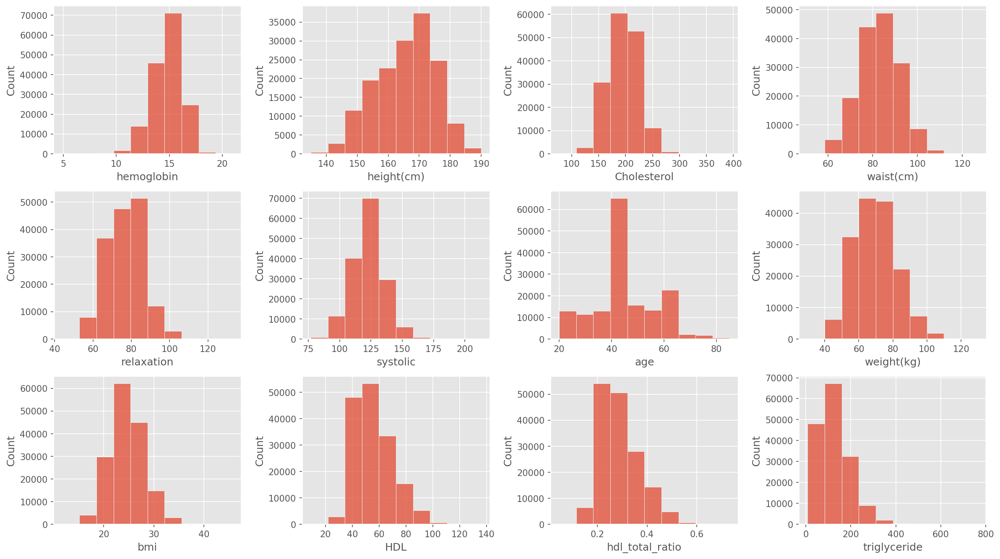

In [17]:
columns_w_no_positive_skew = skewness[skewness <= 1].index
n_rows = 3
n_cols = 4

fig, axs = plt.subplots(n_rows, n_cols, figsize = (4 * n_cols, 3 * n_rows))
for i in range(n_rows):
    for j in range(n_cols):
        _ = sns.histplot(data=train, x=columns_w_no_positive_skew[n_cols * i + j], ax=axs[i,j], bins=10)
        
fig.tight_layout()

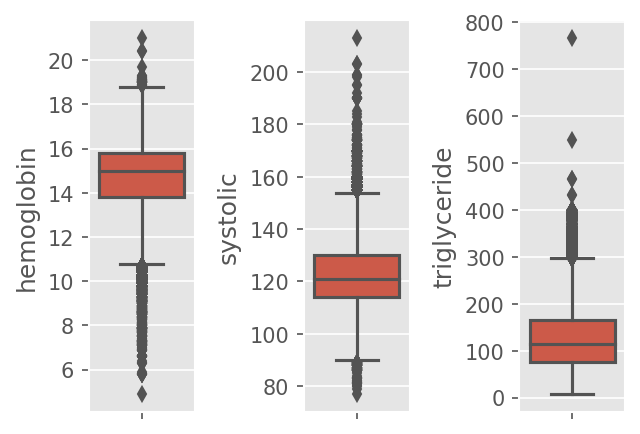

In [18]:
columns_further = ['hemoglobin', 'systolic', 'triglyceride']

n_cols = 3
fig, axs = plt.subplots(1, n_cols, figsize=(1.5 * n_cols, 3))
for i in range(n_cols):
    _ = sns.boxplot(train, y = columns_further[i], ax=axs[i])

fig.tight_layout()

In [19]:
cols_w_positive_skew = skewness[skewness > 1].index
train[cols_w_positive_skew] = train[cols_w_positive_skew].apply(np.log1p)
train = train.rename({col:f'log1p_{col}' for col in cols_w_positive_skew}, axis=1)

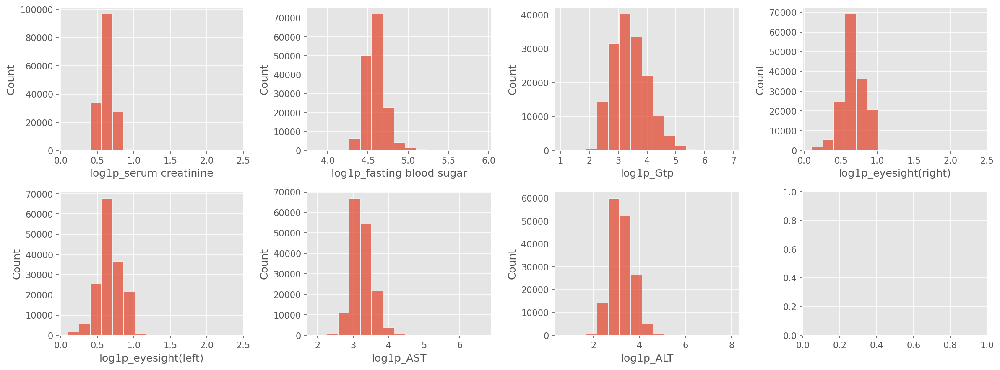

In [20]:
n_rows = 2
n_cols = 4

fig, axs = plt.subplots(n_rows, n_cols, figsize = (4 * n_cols, 3 * n_rows))
for i in range(n_rows):
    for j in range(n_cols):
        col_index = n_cols * i + j
        if col_index == len(cols_w_positive_skew):
            break
        column = cols_w_positive_skew[col_index]
        _ = sns.histplot(train, x=f'log1p_{column}', ax=axs[i,j], bins=15)
        
fig.tight_layout()

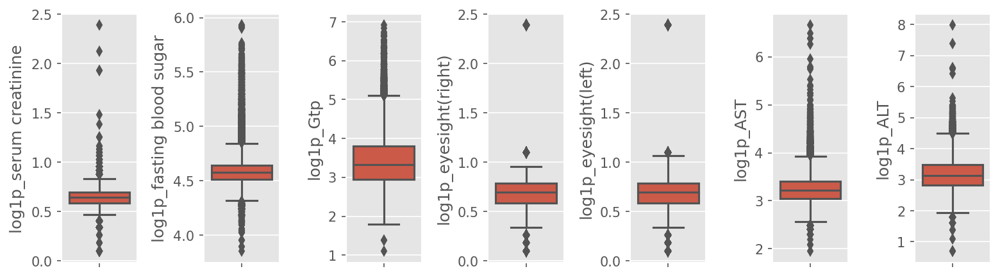

In [21]:
n_cols = len(cols_w_positive_skew)
fig, axs = plt.subplots(1, n_cols, figsize=(1.5 * n_cols, 3))
for i in range(n_cols):
    _ = sns.boxplot(train, y = f'log1p_{cols_w_positive_skew[i]}', ax=axs[i])
fig.tight_layout()

### Correlation analysis - hierarchical clustering

We now compute the correlations between pairs of the features, and drop ones which are highly correlated with each other. Since there are many columns, we will perform hierarchical clustering to cluster the features.

Hierarchical clustering arranges the data (in our case, features) using a dissimilarity (or distance) matrix. In our case, we compute the dissimilarity between two features $x_i$ and $x_j$  as
$$
    \large
    d(x_i,x_j) = 1 - |\rho(x_i, x_j)|,
$$
where $\rho(x_i, x_j)$ is the Pearson correlation between $x_1$ and $x_2$.

In [22]:
# hierarchical clustering
from scipy.cluster import hierarchy
from scipy.spatial.distance import squareform

# construct correlation matrix
corr_matrix = train.drop(['smoking', 'dental caries', 'bp_cat'], axis=1).corr(method='pearson')

# hierarchical cluster based on the correlations
dissimilarity = 1 - abs(corr_matrix.values)

After computing the dissimilaity matrix, we then perform hierarchical clustering on the features. We can then visualize the hierarchy of relationships using a dendrogram plot, which displays a tree-like structure, with branches that represent the merging of similar features at different levels of dissimilarity. The leaves of the dendograms are the features.

There are some features that have an absololute value of correlation > 0.8: 
1. `weight(kg)`, `waist(cm)`, `bmi`
2. `HDL`, `hdl_total_ratio`

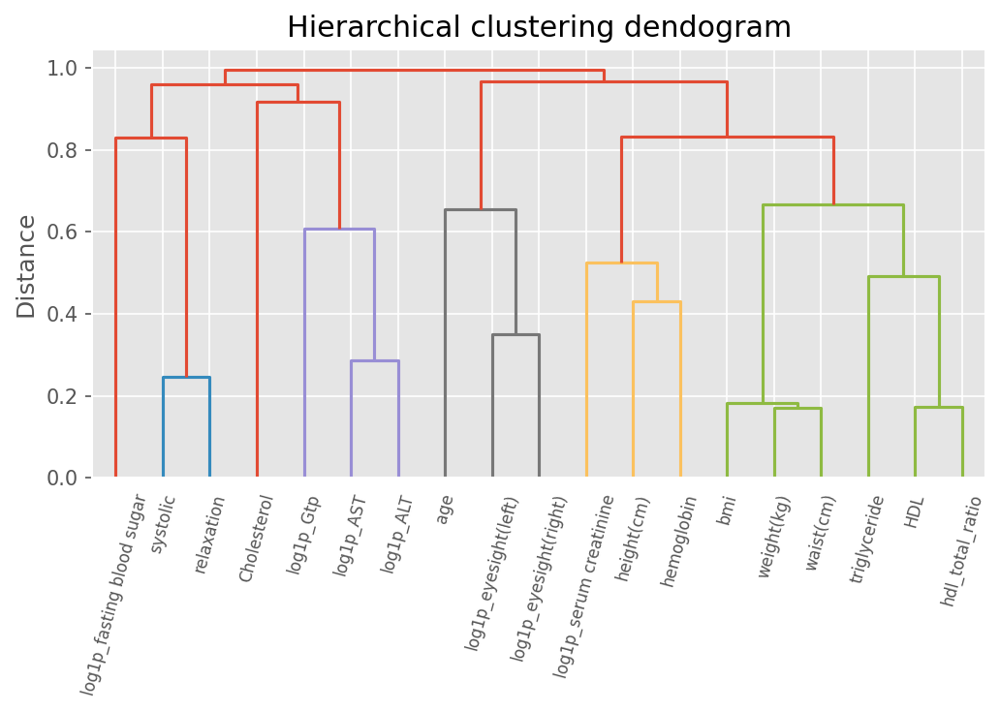

In [23]:
linkage_matrix = hierarchy.linkage(squareform(dissimilarity), method='complete')

# plot the dendogram
fig,ax = plt.subplots(1,1,figsize=(7,5))
dendogram = hierarchy.dendrogram(
    linkage_matrix, ax=ax, 
    labels=corr_matrix.columns.tolist(),
)
_ = ax.set_xticklabels(ax.get_xticklabels(), rotation=75, fontsize=8)
_ = ax.set_ylabel('Distance')
_ = ax.set_title('Hierarchical clustering dendogram')
fig.tight_layout()

## Distributions by class

We now look at the marginal distributions of the features conditioned by class.

We begin by plotting the counts of the two levels for `dental caries` with the counts grouped by the response `smoking`. Clearly the percentage of smokers is slightly large when `dental caries` = 1

/opt/conda/lib/python3.10/site-packages/seaborn/axisgrid.py:118: UserWarning:

The figure layout has changed to tight



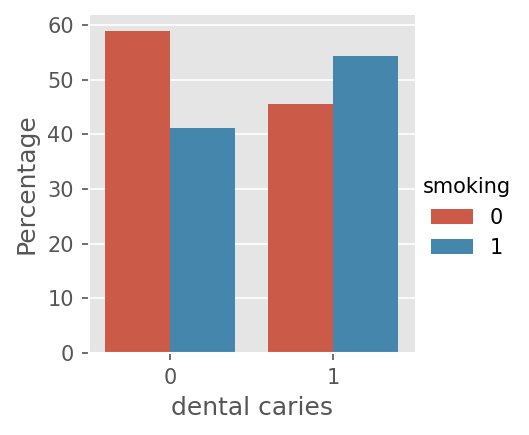

In [24]:
_ = (
    train
    .groupby('dental caries')['smoking']
    .value_counts(normalize=True)
    .mul(100)
    .rename('Percentage')
    .reset_index()
    .pipe((sns.catplot, 'data'), x='dental caries', y='Percentage', hue='smoking', kind='bar', height=3)
)

/opt/conda/lib/python3.10/site-packages/seaborn/axisgrid.py:118: UserWarning:

The figure layout has changed to tight



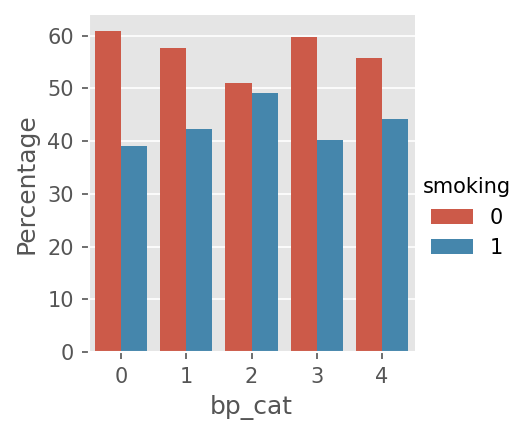

In [25]:
_ = (
    train
    .groupby('bp_cat')['smoking']
    .value_counts(normalize=True)
    .mul(100)
    .rename('Percentage')
    .reset_index()
    .pipe((sns.catplot, 'data'), x='bp_cat', y='Percentage', hue='smoking', kind='bar', height=3)
)

We now plot the boxplots of the remaning features grouped by the different classes. There are quite a few features that have different distributions conditioned on the class - notably `height(cm)`, `weight(kg)`, `hemoglobin` and `log1p_Gtp` - but it is somewhat difficult to conclude definitively since there are many outliers within each conditional distribution. 

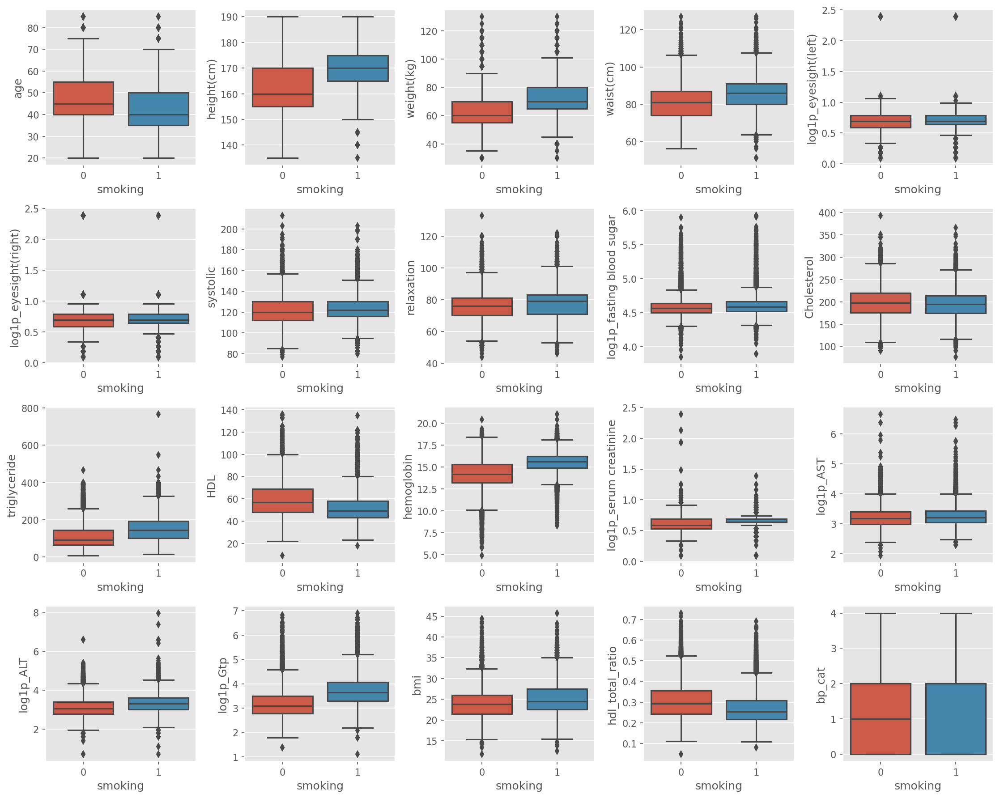

In [26]:
numerical_features = train.drop(['smoking', 'dental caries'], axis=1).columns.tolist()
n_rows = 4
n_cols = 5
fig,axs = plt.subplots(n_rows, n_cols,figsize=(3 * n_cols, 3 * n_rows))
for i in range(n_rows):
    for j in range(n_cols):
        col_index = n_cols*i+j
        if col_index == len(numerical_features):
            break
            
        _ = sns.boxplot(data=train, y=numerical_features[col_index], x='smoking', ax=axs[i,j])
        
fig.tight_layout()

### Mutual information scores

Before we fit the model, we compute the mutual information scores of the features with respect to the target.

In [27]:
X = train.drop('smoking', axis=1)
y = train['smoking'].values

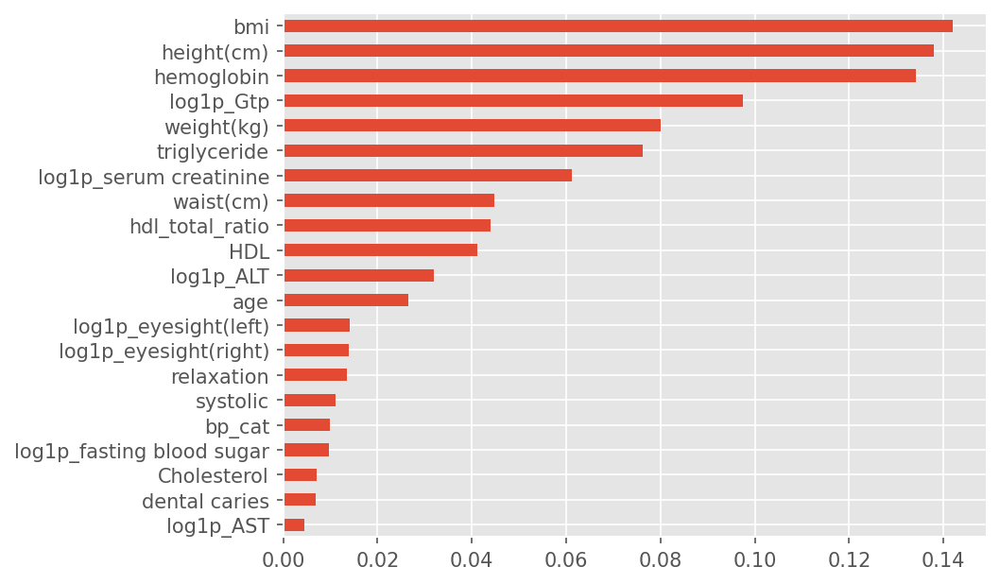

In [28]:
from sklearn.feature_selection import mutual_info_classif

mi_scores = pd.Series(
    mutual_info_classif(X, y),
    index=X.columns.tolist()
).sort_values()

_ = mi_scores.plot(kind='barh')

Here is the scatterplot matrix of the top 4 features (sorted by mutual information scores), and color coded by the smoking status. The decision boundaries don't seem to be simple. 

In [29]:
fig = px.scatter_matrix(
    train, 
    dimensions=['bmi', 'height(cm)', 'hemoglobin', 'log1p_Gtp'],
    color='smoking',
    color_discrete_map = {0: 'blue', 1:'red'},
    color_discrete_sequence= ['blue', 'red'],
    opacity=0.25, width = 900, height=900
)

fig.update_traces(diagonal_visible=False,  showupperhalf=False)
fig.show()

## XGBoost model

The function `fit_model` in the cell below, trains a xgboost classifier. The function also allows the specification of hyperparameters as a dictionary through the `config` argument. If `config` is not specified, default values for the hyperparameters are used.

In [30]:
def fit_model(
    X:pd.DataFrame,
    y:np.ndarray,
    config:Optional[Dict]=None,
    n_jobs:int=1
) -> XGBClassifier:
    '''
    Train a xgboost classifier
    '''
    
    model = XGBClassifier(
        n_jobs =n_jobs,
        tree_method='hist'
    )
    
    if config:
        # if config is supplied, set the model hyperparameters
        model.set_params(**config)
    
    return model.fit(X, y)

## Tuning hyperparameters via Bayesian optimization 

Optuna requires a sampling strategy to propose new trials. The `BoTorchSampler` from `optuna.integration`  uses a Gaussian process (GP) based Bayesian Optimization (BO) strategy to propose a new trial given the history of trials. To explain the There are two parts:

1. First, a GP model is trained to predict the cross-validation AUC as a function of the xgboost hyperparameters. This GP model can then generate predictions for any new hyperparameter configuration, as well as an estimate of uncertainty for this prediction.
2. Then, we optimze the (log) Expected Improvement (EI) objective that balances (a) selecting the configuration with the best predicted ROC-AUC vs (b) selecting the configuration with the largest prediction uncertainty

Under many conditions, the `BoTorchSampler` will require fewer number of trials on average than the optuna's default `TPESampler`.

In [31]:
import warnings
def fit_and_test_fold(config:Dict, X:pd.DataFrame, y:np.ndarray, train_index:np.ndarray, test_index:np.ndarray) -> float:
    X_train = X.iloc[train_index,:];X_test = X.iloc[test_index,:]
    y_train = y[train_index]; y_test = y[test_index]
    
    # fit model on training data
    with warnings.catch_warnings():
        warnings.simplefilter("ignore")
        model = fit_model(X_train, y_train, config, n_jobs=4)
    
    # generate predictions on test data
    test_prob = model.predict_proba(X_test)[:,1]
    
    return roc_auc_score(y_test, test_prob)


def optuna_objective(trial):
    config = {
        'n_estimators': trial.suggest_int('n_estimators', 50, 1000, log=True),
        'learning_rate': trial.suggest_float('learning_rate', 1e-4, 0.7, log=True),
        'max_depth': trial.suggest_int('max_depth', 1, 12, log=True),
        'subsample': trial.suggest_float("subsample", 0.1, 1),
        'colsample_bytree': trial.suggest_float("colsample_bytree", 0.1, 1),
        'min_child_weight': trial.suggest_float('min_child_weight', 1e-8, 100, log=True),
        'reg_alpha': trial.suggest_float('reg_alpha', 1e-8, 100, log=True),
        'reg_lambda': trial.suggest_float('reg_lambda', 1e-8, 100,log=True),
        'gamma': trial.suggest_float('gamma', 1e-8, 100,log=True),
    }
    
    
    cv = StratifiedKFold(n_splits=5, random_state=1, shuffle=True)
    cv_auc_scores = [None]*5
    for i, (train_index, test_index) in enumerate(cv.split(X,y)):
        cv_auc_scores[i] = fit_and_test_fold(config, X, y, train_index, test_index)
        
    return np.mean(cv_auc_scores)

In [32]:
sampler = BoTorchSampler(
    n_startup_trials=10,# recommended minimum: max(5,1+no_of_hyperparameters)
    seed=0
)

study = optuna.create_study(
    directions=['maximize'], sampler=sampler,study_name='xgboost'
)

warnings.filterwarnings("ignore", category=optuna.exceptions.ExperimentalWarning, module='optuna.integration')
# run optuna for a maxmimum of 100 trials or 3000 sec wall-clock time
study.optimize(optuna_objective, n_trials=100, timeout=3000) 

/tmp/ipykernel_20/1560624071.py:1: ExperimentalWarning:

BoTorchSampler is experimental (supported from v2.4.0). The interface can change in the future.

[I 2023-10-27 03:02:45,787] A new study created in memory with name: xgboost
[I 2023-10-27 03:02:56,396] Trial 0 finished with value: 0.8567178042950726 and parameters: {'n_estimators': 258, 'learning_rate': 0.05623066645615501, 'max_depth': 3, 'subsample': 0.5903948646972071, 'colsample_bytree': 0.4812893194050143, 'min_child_weight': 0.028770084050677908, 'reg_alpha': 0.00023761404778025518, 'reg_lambda': 8.274276086161453, 'gamma': 43.31393146405955}. Best is trial 0 with value: 0.8567178042950726.
[I 2023-10-27 03:03:03,955] Trial 1 finished with value: 0.861983392688083 and parameters: {'n_estimators': 157, 'learning_rate': 0.110728748700497, 'max_depth': 3, 'subsample': 0.6112401049845391, 'colsample_bytree': 0.933036974463395, 'min_child_weight': 5.132873745854718e-08, 'reg_alpha': 7.435205853060173e-08, 'reg_lambda': 1.5928833

In [33]:
results = study.trials_dataframe(attrs=('number','value', 'duration', 'params'))
results = results.rename(columns={'value':'roc-auc'})
results['duration'] = results['duration']/np.timedelta64(1, 's')
results = results.sort_values(by='roc-auc',ascending=False)
results.to_csv('cv_auc_history.csv',index=False)
# print the top 10 results
results.head(10)

,number,roc-auc,duration,params_colsample_bytree,params_gamma,params_learning_rate,params_max_depth,params_min_child_weight,params_n_estimators,params_reg_alpha,params_reg_lambda,params_subsample
41,41,0.871336,78.399574,0.296145,2.634982e-05,0.031331,9,3.743542e+01,1000,0.015575,1.562997e-04,0.905875
43,43,0.870716,67.329557,0.413337,1.830769e-06,0.035655,8,1.000000e+02,1000,0.000810,3.709901e-03,0.876124
44,44,0.870461,75.278938,0.505172,1.445243e-05,0.031186,9,1.000000e+02,1000,0.284410,9.215750e-04,0.751535
45,45,0.870385,78.747172,0.208445,4.582984e-07,0.036680,8,7.736839e-01,1000,0.133625,3.229654e-02,0.750607
40,40,0.870093,66.949776,0.339774,5.157628e-06,0.030825,7,3.429920e+00,1000,0.003900,3.398357e-07,0.711717
34,34,0.869982,101.516341,0.328550,4.586429e-04,0.020244,9,1.456371e-01,1000,0.000313,2.263828e-04,0.690022
35,35,0.869957,102.570734,0.383629,7.818579e-06,0.019413,9,1.184979e-04,1000,0.000690,2.755038e-04,0.765105
38,38,0.869860,84.965046,0.323304,2.283054e-04,0.021210,8,2.697817e-05,1000,0.000208,1.849028e-04,0.729427
29,29,0.869761,71.906835,0.302168,1.333403e-05,0.027410,8,1.020232e-07,856,0.000177,1.244960e-03,0.659400
39,39,0.869621,85.987971,0.509809,7.282354e-04,0.026181,9,2.573577e+00,1000,0.000151,1.847699e-07,0.983799


## Final model

In [34]:
model = fit_model(X, y, study.best_params, n_jobs=4)
model.save_model('xgboost_defect_predict.json')

We now compute the gain based feature importance measures from the xgboost model. From a model trained after preliminary hyperparameter tuning, `height(cm)` seems to be the most important feature, with `log1p_Gtp` coming a distant second. The order can change depending on the hyperparameters chosen after a more exhaustive hyperparameter optimization run.

Notes:

 1. Feature importance measures from tree based models can be misleading.
 2. In xgboost, the default feature importance measure is based on the total gain from splits involving the feature.

<Axes: >

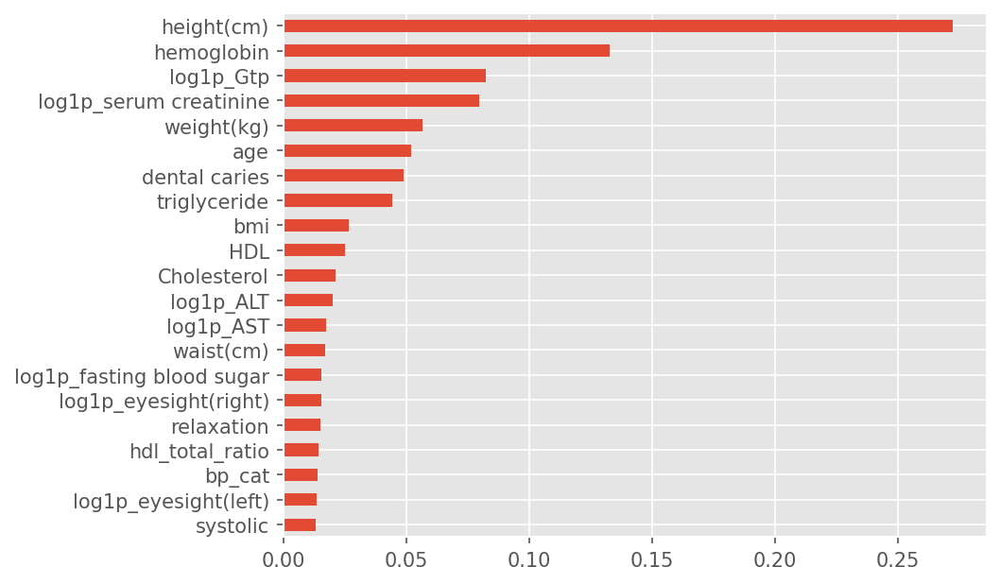

In [35]:
# gain based feature importances - not necessarily the most reliable
feat_imp = pd.Series(model.feature_importances_,X.columns).sort_values(ascending=True)
feat_imp.plot(kind='barh')

## Submission

In [36]:
# preprocess test data

# drop features
test = test.drop(high_mode_per.index.tolist(), axis=1)
del test['LDL']

# new features
new_features(test)

# Log-transform 
test[cols_w_positive_skew] = test[cols_w_positive_skew].apply(np.log1p)
test = test.rename({col:f'log1p_{col}' for col in cols_w_positive_skew}, axis=1)

In [37]:
submission = pd.DataFrame({
    'id':test.index.values,
    'defects': model.predict_proba(test)[:,1]
})
submission.to_csv('submission.csv',index=False)